### Data Preprocessing

In [1]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 66 bytes


In [2]:
!kaggle datasets download "chrisfilo/fruit-recognition"

100% 7.91G/7.92G [02:00<00:00, 91.0MB/s]
100% 7.92G/7.92G [02:00<00:00, 70.7MB/s]


In [3]:
!unzip fruit-recognition.zip

Streaming output truncated to the last 5000 lines.
  inflating: Pomegranate/Pomegranet00322.png  
  inflating: Pomegranate/Pomegranet00323.png  
  inflating: Pomegranate/Pomegranet00324.png  
  inflating: Pomegranate/Pomegranet00325.png  
  inflating: Pomegranate/Pomegranet00326.png  
  inflating: Pomegranate/Pomegranet00327.png  
  inflating: Pomegranate/Pomegranet00328.png  
  inflating: Pomegranate/Pomegranet00329.png  
  inflating: Pomegranate/Pomegranet0033.png  
  inflating: Pomegranate/Pomegranet00330.png  
  inflating: Pomegranate/Pomegranet00331.png  
  inflating: Pomegranate/Pomegranet00332.png  
  inflating: Pomegranate/Pomegranet00333.png  
  inflating: Pomegranate/Pomegranet00334.png  
  inflating: Pomegranate/Pomegranet00335.png  
  inflating: Pomegranate/Pomegranet00336.png  
  inflating: Pomegranate/Pomegranet00337.png  
  inflating: Pomegranate/Pomegranet00338.png  
  inflating: Pomegranate/Pomegranet00339.png  
  inflating: Pomegranate/Pomegranet0034.png  
  inflating

In [134]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import cv2
import matplotlib.pyplot as plt
import random
import time
import datetime
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
import keras
from keras import Sequential
from keras.layers import Activation, Dropout, Flatten, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.utils import shuffle

In [5]:
!rm -r /content/sample_data/
!rm /content/fruit-recognition.zip

In [6]:
!rm -r /content/.config/

In [32]:
!rm /content/best_model.h5
!rm -r /content/Guava/
!rm -r /content/Apple/
!rm -r /content/Kiwi/
!rm -r /content/Mango/

In [7]:
def load_images_from_folder(folder,only_path = False, label = ""):
    if only_path == False:
        images = []
        for filename in os.listdir(folder):
            img = cv2.imread(os.path.join(folder,filename))
            if img is not None:
                images.append(img)
        return images
    else:
        path = []
        for filename in os.listdir(folder):
            img_path = os.path.join(folder,filename)
            if img_path is not None:
                path.append([label,img_path])
        return path

In [33]:
images = []
dirp = "/content/"
for f in os.listdir(dirp):
    if "png" in os.listdir(dirp+f)[0]:
        images += load_images_from_folder(dirp+f,True,label = f)
    else:
        for d in os.listdir(dirp+f):
            images += load_images_from_folder(dirp+f+"/"+d,True,label = f)

In [34]:
df = pd.DataFrame(images, columns = ["fruit", "path"])

In [35]:
df.head()

,fruit,path
0,Pomegranate,/content/Pomegranate/Pomegranet00713.png
1,Pomegranate,/content/Pomegranate/Pomegranet00381.png
2,Pomegranate,/content/Pomegranate/Pomegranet001993.png
3,Pomegranate,/content/Pomegranate/Pomegranet00830.png
4,Pomegranate,/content/Pomegranate/Pomegranet001772.png


#### Size

In [36]:
df.shape

(27047, 2)

According to dataset source images are 320×258 pixels, but as seen above they come in various sizes.


#### Changes in structure

In [12]:
def load_img(df):
    img_paths = df["path"].values
    img_labels = df["label"].values
    X = []
    y = []
    
    for i,path in enumerate(img_paths):
        img =  cv2.imread(path)
        img = cv2.resize(img, (150,150))
        label = img_labels[i]
        X.append(img)
        y.append(label)
    return np.array(X),np.array(y)

#### Label assignment

In [37]:
fruit_names = sorted(df.fruit.unique())
mapper_fruit_names = dict(zip(fruit_names, [t for t in range(len(fruit_names))]))
df["label"] = df["fruit"].map(mapper_fruit_names)
print(mapper_fruit_names)

{'Banana': 0, 'Carambola': 1, 'Orange': 2, 'Peach': 3, 'Pear': 4, 'Persimmon': 5, 'Pitaya': 6, 'Plum': 7, 'Pomegranate': 8, 'Tomatoes': 9, 'muskmelon': 10}


#### Shuffling

In [38]:
df = shuffle(df, random_state = 0)
df = df.reset_index(drop=True)

In [39]:
df.head(15)

,fruit,path,label
0,Banana,/content/Banana/Banana02435.png,0
1,Persimmon,/content/Persimmon/Persimmon1886.png,5
2,Peach,/content/Peach/Peach001474.png,3
3,Pear,/content/Pear/Pear 1616.png,4
4,Pomegranate,/content/Pomegranate/Pomegranet001091.png,8
5,Peach,/content/Peach/Peach00420.png,3
6,Banana,/content/Banana/Banana01902.png,0
7,Pomegranate,/content/Pomegranate/Pomegranet002148.png,8
8,Carambola,/content/Carambola/Carambola 0014.png,1
9,muskmelon,/content/muskmelon/Muskmelon 001935.png,10


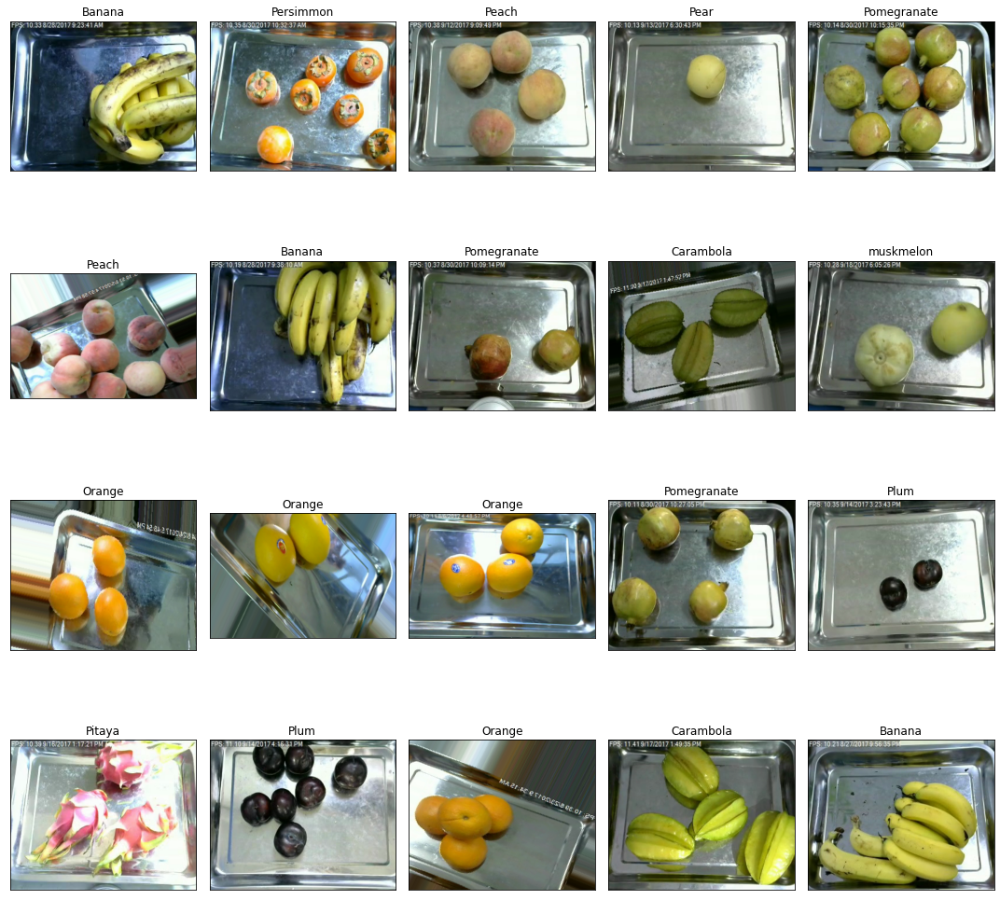

In [40]:
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(df.path[i]))
    ax.set_title(df.fruit[i])
plt.tight_layout()
plt.show()

#### Dividing the data into train and test sets

In [41]:
train = cut_df(df,2,1)
test = cut_df(df,2,2)

#### Class distribution in sets

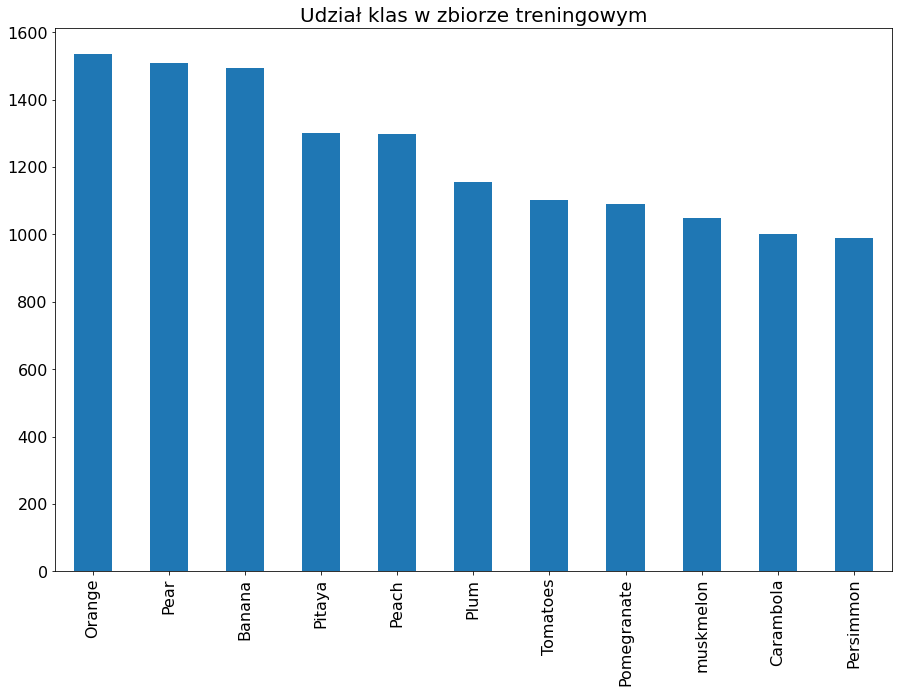

In [190]:
plt.figure(figsize=(15,10))
p = train["fruit"].value_counts().plot(kind='bar')
plt.title("Udział klas w zbiorze treningowym", fontsize = 20)
p.tick_params(labelsize=16)
plt.show()

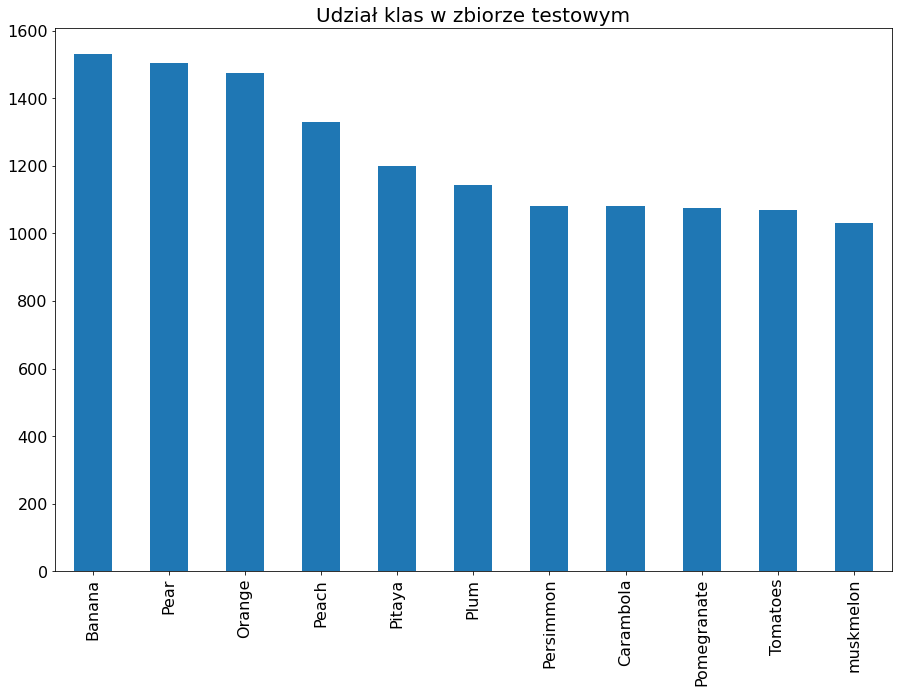

In [189]:
plt.figure(figsize=(15,10))
p = test["fruit"].value_counts().plot(kind='bar')
plt.title("Udział klas w zbiorze testowym", fontsize = 20)
p.tick_params(labelsize=16)
plt.show()

### Model

In [18]:
def from_categorical(lst):
    """
    Inverse of to_categorical
    Example: [[0,0,0,1,0], [1,0,0,0,0]] => [3,0]
    """
    
    lst = lst.tolist()
    lst2 = []
    for x in lst:
        lst2.append(x.index(max(x)))
    return lst2


def display_stats(y_test, pred):
    print(f"### Result of the predictions using {len(y_test)} test data ###\n")
    y_test_class = from_categorical(y_test)
    print("Classification Report:\n")
    print(classification_report(y_test_class, pred))
    print("\nConfusion Matrix:\n\n")
    print(confusion_matrix(y_test_class, pred))
    print("\nAccuracy:", round(accuracy_score(y_test_class, pred),5))
    
def plot_training(model):
    history = pd.DataFrame(model.history.history)
    history[["accuracy","val_accuracy"]].plot()
    plt.title("Training results")
    plt.xlabel("# epoch")
    plt.show()
    
def cut_df(df, number_of_parts, part):
# Return a part of the dataframe
# For example, if a dataframe has 10 rows and we want to return a part of them
# if it is cut in two, it will return the first 5 rows or the last 5 rows depending the part wanted

# Args:
#     df (pandas.DataFrame): The dataframe to cut a part of
#     number_of_parts (int): In how many parts should the dataframe be cut
#     part (int): The part of the dataframe to return

    if part < 1:
        print("Error, the part should be at least 1")
    elif part > number_of_parts:
        print("Error, the part cannot be higher than the number_of_parts")
        
    number_imgs_each_part = int(df.shape[0]/number_of_parts)
    idx1 = (part-1) * number_imgs_each_part
    idx2 = part * number_imgs_each_part
    return df.iloc[idx1:idx2]

In [136]:
model = Sequential()
model.add(keras.layers.Flatten(input_shape=(150, 150,3)))
model.add(Dense(128,activation="relu"))
model.add(Dense(64,activation="relu"))
model.add(Dense(11,activation="softmax"))
model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_8 (Flatten)          (None, 67500)             0         
_________________________________________________________________
dense_19 (Dense)             (None, 128)               8640128   
_________________________________________________________________
dense_20 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_21 (Dense)             (None, 11)                715       
Total params: 8,649,099
Trainable params: 8,649,099
Non-trainable params: 0
_________________________________________________________________


In [137]:
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

### Training and evaluation

In [82]:
X_train, y_train = load_img(train)
y_train = to_categorical(y_train)

KeyboardInterrupt: ignored

In [133]:
%load_ext tensorboard

In [135]:
!rm -rf ./logs/

In [139]:
hists = []
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

callbacks = [EarlyStopping(monitor='val_loss', patience=10),
             ModelCheckpoint(filepath='best_model.h5', monitor='val_loss', save_best_only=True),
             keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)]
start=time.time()
model.fit(X_train, y_train, batch_size=128, epochs=10, callbacks=callbacks, validation_split = 0.1, verbose = 1)
end=time.time()
hists.append(model.history.history)

Epoch 1/10
96/96 [==============================] - 15s 150ms/step - loss: 4333.9059 - accuracy: 0.1658 - val_loss: 76.4737 - val_accuracy: 0.5691
Epoch 2/10
96/96 [==============================] - 15s 157ms/step - loss: 83.8086 - accuracy: 0.5386 - val_loss: 209.1294 - val_accuracy: 0.3836
Epoch 3/10
96/96 [==============================] - 13s 138ms/step - loss: 111.8607 - accuracy: 0.5336 - val_loss: 46.6558 - val_accuracy: 0.6305
Epoch 4/10
96/96 [==============================] - 13s 136ms/step - loss: 87.4352 - accuracy: 0.5965 - val_loss: 40.0090 - val_accuracy: 0.6386
Epoch 5/10
96/96 [==============================] - 13s 137ms/step - loss: 50.3552 - accuracy: 0.6501 - val_loss: 46.2203 - val_accuracy: 0.6955
Epoch 6/10
96/96 [==============================] - 13s 136ms/step - loss: 40.3043 - accuracy: 0.7110 - val_loss: 74.3925 - val_accuracy: 0.5721
Epoch 7/10
96/96 [==============================] - 13s 138ms/step - loss: 36.1344 - accuracy: 0.7404 - val_loss: 95.8503 - va

In [ ]:
X, y = load_img(test)

In [140]:
pred = model.predict_classes(X)
y_test = to_categorical(y)

display_stats(y_test, pred)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


### Result of the predictions using 13523 test data ###

Classification Report:

              precision    recall  f1-score   support

           0       0.52      0.91      0.66      1532
           1       0.98      0.71      0.82      1080
           2       0.86      0.74      0.80      1476
           3       0.81      0.82      0.81      1330
           4       0.99      0.55      0.71      1505
           5       0.79      0.84      0.81      1082
           6       0.87      0.84      0.85      1200
           7       0.78      1.00      0.88      1143
           8       1.00      0.60      0.75      1076
           9       0.77      0.87      0.81      1069
          10       0.85      0.80      0.82      1030

    accuracy                           0.79     13523
   macro avg       0.84      0.79      0.79     13523
weighted avg       0.83      0.79      0.79     13523


Confusion Matrix:


[[1396    6   34   18    6    8    6   44    0    2   12]
 [ 206  763   31    0    0 

In [192]:
fruit_names

['Banana',
 'Carambola',
 'Orange',
 'Peach',
 'Pear',
 'Persimmon',
 'Pitaya',
 'Plum',
 'Pomegranate',
 'Tomatoes',
 'muskmelon']

### Model rating

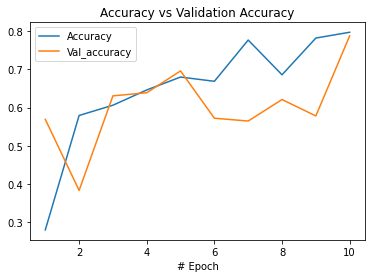

In [141]:
acc = []
val_acc = []
for i in range(len(hists)):
    acc += hists[i]["accuracy"]
    val_acc += hists[i]["val_accuracy"]
hist_df = pd.DataFrame({"# Epoch": [e for e in range(1,len(acc)+1)],"Accuracy": acc, "Val_accuracy": val_acc})
hist_df.plot(x = "# Epoch", y = ["Accuracy","Val_accuracy"])
plt.title("Accuracy vs Validation Accuracy")
plt.show()

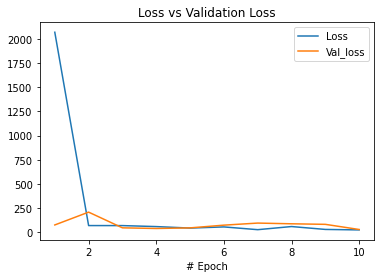

In [142]:
acc = []
val_acc = []
for i in range(len(hists)):
    acc += hists[i]["loss"]
    val_acc += hists[i]["val_loss"]
hist_df = pd.DataFrame({"# Epoch": [e for e in range(1,len(acc)+1)],"Loss": acc, "Val_loss": val_acc})
hist_df.plot(x = "# Epoch", y = ["Loss","Val_loss"])
plt.title("Loss vs Validation Loss")
plt.show()

### Result analysis

In [143]:
predictions = model.predict(X)

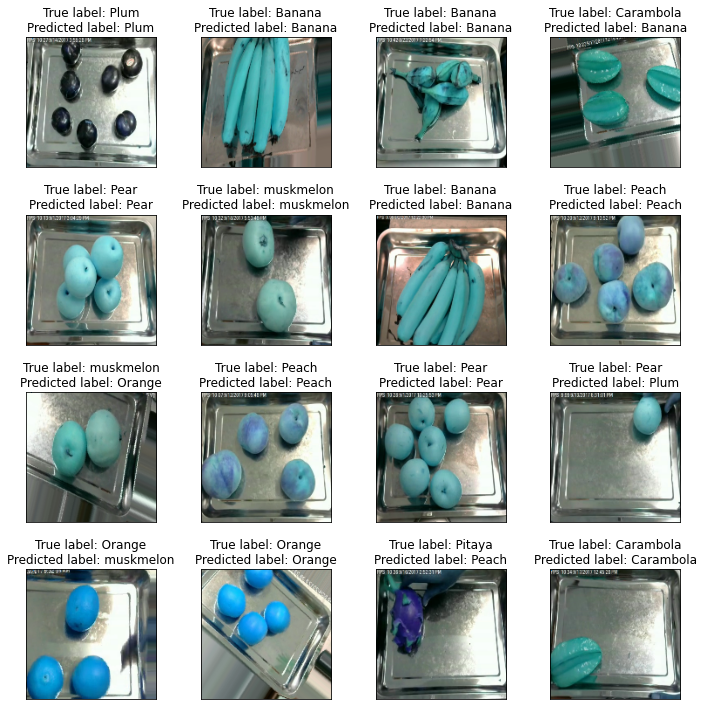

In [144]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.bar(range(11),predictions[i])
    ax.imshow(X[-i])
    ax.set_title(f"True label: {fruit_names[y[-i]]}\nPredicted label: {fruit_names[pred[-i]]}")

plt.tight_layout()

plt.show()

In [145]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

### Adjusting network parameters

#### Selu

In [146]:
model = Sequential()
model.add(keras.layers.Flatten(input_shape=(150, 150,3)))
model.add(Dense(128,activation="selu"))
model.add(Dense(64,activation="selu"))
model.add(Dense(11,activation="softmax"))
model.summary()
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_9 (Flatten)          (None, 67500)             0         
_________________________________________________________________
dense_22 (Dense)             (None, 128)               8640128   
_________________________________________________________________
dense_23 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_24 (Dense)             (None, 11)                715       
Total params: 8,649,099
Trainable params: 8,649,099
Non-trainable params: 0
_________________________________________________________________


In [147]:
callbacks = [EarlyStopping(monitor='val_loss', patience=10)]
model.fit(X_train, y_train, batch_size=128, epochs=10, callbacks=callbacks, validation_split = 0.1, verbose = 1)

Epoch 1/10
96/96 [==============================] - 14s 141ms/step - loss: 3231.0795 - accuracy: 0.1960 - val_loss: 143.9489 - val_accuracy: 0.5152
Epoch 2/10
96/96 [==============================] - 13s 137ms/step - loss: 126.2385 - accuracy: 0.5751 - val_loss: 312.8118 - val_accuracy: 0.3976
Epoch 3/10
96/96 [==============================] - 13s 136ms/step - loss: 154.3420 - accuracy: 0.6119 - val_loss: 102.1758 - val_accuracy: 0.6371
Epoch 4/10
96/96 [==============================] - 13s 137ms/step - loss: 76.7128 - accuracy: 0.6825 - val_loss: 126.5737 - val_accuracy: 0.5802
Epoch 5/10
96/96 [==============================] - 13s 136ms/step - loss: 155.0814 - accuracy: 0.6023 - val_loss: 57.5453 - val_accuracy: 0.7398
Epoch 6/10
96/96 [==============================] - 13s 138ms/step - loss: 63.5234 - accuracy: 0.7456 - val_loss: 93.8249 - val_accuracy: 0.6770
Epoch 7/10
96/96 [==============================] - 13s 136ms/step - loss: 51.2736 - accuracy: 0.7760 - val_loss: 81.0268

In [148]:
pred = model.predict_classes(X)
y_test = to_categorical(y)

display_stats(y_test, pred)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


### Result of the predictions using 13523 test data ###

Classification Report:

              precision    recall  f1-score   support

           0       0.39      0.95      0.56      1532
           1       0.76      0.83      0.79      1080
           2       0.94      0.56      0.70      1476
           3       0.98      0.60      0.74      1330
           4       0.99      0.23      0.37      1505
           5       0.92      0.74      0.82      1082
           6       0.99      0.55      0.70      1200
           7       0.87      0.96      0.91      1143
           8       0.34      0.86      0.49      1076
           9       0.85      0.55      0.67      1069
          10       0.98      0.37      0.54      1030

    accuracy                           0.65     13523
   macro avg       0.82      0.65      0.66     13523
weighted avg       0.82      0.65      0.65     13523


Confusion Matrix:


[[1453   26    1    0    0    0    0    3   47    0    2]
 [ 171  898    0    0    0 

In [163]:
0.64786-0.78659

0.13873000000000002

#### Tanh

In [149]:
model = Sequential()
model.add(keras.layers.Flatten(input_shape=(150, 150,3)))
model.add(Dense(128,activation="tanh"))
model.add(Dense(64,activation="tanh"))
model.add(Dense(11,activation="softmax"))
model.summary()
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_10 (Flatten)         (None, 67500)             0         
_________________________________________________________________
dense_25 (Dense)             (None, 128)               8640128   
_________________________________________________________________
dense_26 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_27 (Dense)             (None, 11)                715       
Total params: 8,649,099
Trainable params: 8,649,099
Non-trainable params: 0
_________________________________________________________________


In [150]:
callbacks = [EarlyStopping(monitor='val_loss', patience=10)]
model.fit(X_train, y_train, batch_size=128, epochs=10, callbacks=callbacks, validation_split = 0.1, verbose = 1)

Epoch 1/10
96/96 [==============================] - 14s 141ms/step - loss: 2.4455 - accuracy: 0.1170 - val_loss: 2.3912 - val_accuracy: 0.1101
Epoch 2/10
96/96 [==============================] - 16s 166ms/step - loss: 2.3977 - accuracy: 0.1027 - val_loss: 2.3957 - val_accuracy: 0.0746
Epoch 3/10
96/96 [==============================] - 13s 136ms/step - loss: 2.3945 - accuracy: 0.1038 - val_loss: 2.3840 - val_accuracy: 0.1146
Epoch 4/10
96/96 [==============================] - 13s 137ms/step - loss: 2.3939 - accuracy: 0.1059 - val_loss: 2.3865 - val_accuracy: 0.1146
Epoch 5/10
96/96 [==============================] - 13s 137ms/step - loss: 2.3892 - accuracy: 0.1149 - val_loss: 2.3882 - val_accuracy: 0.1101
Epoch 6/10
96/96 [==============================] - 13s 135ms/step - loss: 2.3934 - accuracy: 0.1117 - val_loss: 2.3861 - val_accuracy: 0.1146
Epoch 7/10
96/96 [==============================] - 13s 135ms/step - loss: 2.3889 - accuracy: 0.1158 - val_loss: 2.3874 - val_accuracy: 0.1146

In [151]:
pred = model.predict_classes(X)
y_test = to_categorical(y)

display_stats(y_test, pred)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


### Result of the predictions using 13523 test data ###

Classification Report:

              precision    recall  f1-score   support

           0       0.10      0.00      0.00      1532
           1       0.00      0.00      0.00      1080
           2       0.11      1.00      0.20      1476
           3       0.00      0.00      0.00      1330
           4       0.00      0.00      0.00      1505
           5       0.00      0.00      0.00      1082
           6       0.00      0.00      0.00      1200
           7       0.00      0.00      0.00      1143
           8       0.00      0.00      0.00      1076
           9       0.00      0.00      0.00      1069
          10       0.00      0.00      0.00      1030

    accuracy                           0.11     13523
   macro avg       0.02      0.09      0.02     13523
weighted avg       0.02      0.11      0.02     13523


Confusion Matrix:


[[   2    0 1530    0    0    0    0    0    0    0    0]
 [   1    0 1079    0    0 

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [164]:
0.1093-0.78659

-0.6772900000000001

#### 100 epochs

In [152]:
model = Sequential()
model.add(keras.layers.Flatten(input_shape=(150, 150,3)))
model.add(Dense(128,activation="relu"))
model.add(Dense(64,activation="relu"))
model.add(Dense(11,activation="softmax"))
model.summary()
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_11 (Flatten)         (None, 67500)             0         
_________________________________________________________________
dense_28 (Dense)             (None, 128)               8640128   
_________________________________________________________________
dense_29 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_30 (Dense)             (None, 11)                715       
Total params: 8,649,099
Trainable params: 8,649,099
Non-trainable params: 0
_________________________________________________________________


In [153]:
callbacks = [EarlyStopping(monitor='val_loss', patience=10)]
model.fit(X_train, y_train, batch_size=128, epochs=100, callbacks=callbacks, validation_split = 0.1, verbose = 1)

Epoch 1/100
96/96 [==============================] - 15s 143ms/step - loss: 4263.1730 - accuracy: 0.1936 - val_loss: 68.7546 - val_accuracy: 0.6194
Epoch 2/100
96/96 [==============================] - 13s 137ms/step - loss: 108.4453 - accuracy: 0.5386 - val_loss: 69.5396 - val_accuracy: 0.6349
Epoch 3/100
96/96 [==============================] - 13s 137ms/step - loss: 51.7314 - accuracy: 0.7023 - val_loss: 152.9215 - val_accuracy: 0.5196
Epoch 4/100
96/96 [==============================] - 13s 136ms/step - loss: 106.4761 - accuracy: 0.6151 - val_loss: 72.5164 - val_accuracy: 0.6415
Epoch 5/100
96/96 [==============================] - 13s 136ms/step - loss: 53.2184 - accuracy: 0.7122 - val_loss: 53.7073 - val_accuracy: 0.7066
Epoch 6/100
96/96 [==============================] - 13s 137ms/step - loss: 53.7108 - accuracy: 0.7346 - val_loss: 87.1964 - val_accuracy: 0.6312
Epoch 7/100
96/96 [==============================] - 13s 136ms/step - loss: 33.4632 - accuracy: 0.7984 - val_loss: 110.

In [154]:
pred = model.predict_classes(X)
y_test = to_categorical(y)

display_stats(y_test, pred)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


### Result of the predictions using 13523 test data ###

Classification Report:

              precision    recall  f1-score   support

           0       0.77      0.83      0.80      1532
           1       0.96      0.89      0.92      1080
           2       0.94      0.55      0.69      1476
           3       0.87      0.77      0.82      1330
           4       0.94      0.69      0.80      1505
           5       0.55      0.93      0.69      1082
           6       0.67      0.95      0.79      1200
           7       0.96      1.00      0.98      1143
           8       0.80      0.85      0.83      1076
           9       0.87      0.82      0.84      1069
          10       0.90      0.76      0.82      1030

    accuracy                           0.81     13523
   macro avg       0.84      0.82      0.82     13523
weighted avg       0.84      0.81      0.81     13523


Confusion Matrix:


[[1267   23   14    6   24   67   15    5   87    1   23]
 [  97  959    1    0    0 

In [165]:
0.81106-0.78659

0.024469999999999992

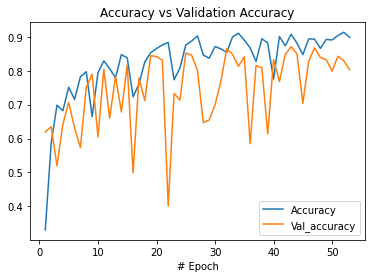

In [155]:
acc = []
val_acc = []
for i in range(len(hists)):
    acc += hists[i]["accuracy"]
    val_acc += hists[i]["val_accuracy"]
hist_df = pd.DataFrame({"# Epoch": [e for e in range(1,len(acc)+1)],"Accuracy": acc, "Val_accuracy": val_acc})
hist_df.plot(x = "# Epoch", y = ["Accuracy","Val_accuracy"])
plt.title("Accuracy vs Validation Accuracy")
plt.show()

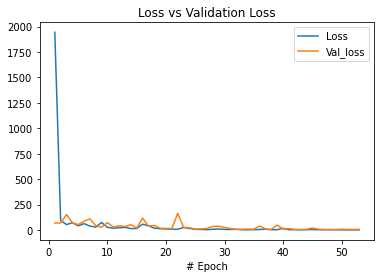

In [156]:
acc = []
val_acc = []
for i in range(len(hists)):
    acc += hists[i]["loss"]
    val_acc += hists[i]["val_loss"]
hist_df = pd.DataFrame({"# Epoch": [e for e in range(1,len(acc)+1)],"Loss": acc, "Val_loss": val_acc})
hist_df.plot(x = "# Epoch", y = ["Loss","Val_loss"])
plt.title("Loss vs Validation Loss")
plt.show()

#### Neurons / 2

In [158]:
model = Sequential()
model.add(keras.layers.Flatten(input_shape=(150, 150,3)))
model.add(Dense(64,activation="relu"))
model.add(Dense(32,activation="relu"))
model.add(Dense(11,activation="softmax"))
model.summary()
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_13 (Flatten)         (None, 67500)             0         
_________________________________________________________________
dense_34 (Dense)             (None, 64)                4320064   
_________________________________________________________________
dense_35 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_36 (Dense)             (None, 11)                363       
Total params: 4,322,507
Trainable params: 4,322,507
Non-trainable params: 0
_________________________________________________________________


In [159]:
callbacks = [EarlyStopping(monitor='val_loss', patience=10)]
model.fit(X_train, y_train, batch_size=128, epochs=10, callbacks=callbacks, validation_split = 0.1, verbose = 1)

Epoch 1/10
96/96 [==============================] - 9s 89ms/step - loss: 2164.3539 - accuracy: 0.1575 - val_loss: 38.8769 - val_accuracy: 0.5292
Epoch 2/10
96/96 [==============================] - 8s 85ms/step - loss: 34.7980 - accuracy: 0.4967 - val_loss: 55.4299 - val_accuracy: 0.3452
Epoch 3/10
96/96 [==============================] - 8s 84ms/step - loss: 50.7231 - accuracy: 0.4508 - val_loss: 23.0460 - val_accuracy: 0.6024
Epoch 4/10
96/96 [==============================] - 8s 86ms/step - loss: 25.5956 - accuracy: 0.6312 - val_loss: 36.7996 - val_accuracy: 0.5418
Epoch 5/10
96/96 [==============================] - 8s 84ms/step - loss: 25.8888 - accuracy: 0.6349 - val_loss: 15.7108 - val_accuracy: 0.7095
Epoch 6/10
96/96 [==============================] - 8s 86ms/step - loss: 17.9493 - accuracy: 0.6594 - val_loss: 15.4685 - val_accuracy: 0.7458
Epoch 7/10
96/96 [==============================] - 8s 85ms/step - loss: 27.9698 - accuracy: 0.6328 - val_loss: 29.6486 - val_accuracy: 0.58

In [160]:
pred = model.predict_classes(X)
y_test = to_categorical(y)

display_stats(y_test, pred)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


### Result of the predictions using 13523 test data ###

Classification Report:

              precision    recall  f1-score   support

           0       0.45      0.85      0.59      1532
           1       0.73      0.67      0.70      1080
           2       0.60      0.62      0.61      1476
           3       0.63      0.79      0.70      1330
           4       0.99      0.35      0.52      1505
           5       0.56      0.61      0.59      1082
           6       0.91      0.32      0.47      1200
           7       0.98      0.57      0.72      1143
           8       0.52      0.78      0.62      1076
           9       0.49      0.75      0.59      1069
          10       0.89      0.38      0.53      1030

    accuracy                           0.61     13523
   macro avg       0.71      0.61      0.60     13523
weighted avg       0.70      0.61      0.60     13523


Confusion Matrix:


[[1303  149   17    2    2    4    4    0   50    1    0]
 [ 286  728    0    0    0 

In [166]:
0.60911-0.78659

-0.17747999999999997

#### Neurons * 2

In [161]:
model = Sequential()
model.add(keras.layers.Flatten(input_shape=(150, 150,3)))
model.add(Dense(256,activation="relu"))
model.add(Dense(128,activation="relu"))
model.add(Dense(11,activation="softmax"))
model.summary()
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_14 (Flatten)         (None, 67500)             0         
_________________________________________________________________
dense_37 (Dense)             (None, 256)               17280256  
_________________________________________________________________
dense_38 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_39 (Dense)             (None, 11)                1419      
Total params: 17,314,571
Trainable params: 17,314,571
Non-trainable params: 0
_________________________________________________________________


In [162]:
callbacks = [EarlyStopping(monitor='val_loss', patience=10)]
model.fit(X_train, y_train, batch_size=128, epochs=10, callbacks=callbacks, validation_split = 0.1, verbose = 1)

Epoch 1/10
96/96 [==============================] - 23s 233ms/step - loss: 5663.4064 - accuracy: 0.1667 - val_loss: 215.5379 - val_accuracy: 0.5735
Epoch 2/10
96/96 [==============================] - 26s 269ms/step - loss: 153.9520 - accuracy: 0.6575 - val_loss: 528.4753 - val_accuracy: 0.2846
Epoch 3/10
96/96 [==============================] - 22s 230ms/step - loss: 215.8031 - accuracy: 0.6120 - val_loss: 89.9483 - val_accuracy: 0.7243
Epoch 4/10
96/96 [==============================] - 22s 229ms/step - loss: 76.4949 - accuracy: 0.7572 - val_loss: 226.0591 - val_accuracy: 0.5358
Epoch 5/10
96/96 [==============================] - 22s 230ms/step - loss: 122.1218 - accuracy: 0.6900 - val_loss: 101.7148 - val_accuracy: 0.7162
Epoch 6/10
96/96 [==============================] - 22s 230ms/step - loss: 72.6921 - accuracy: 0.7578 - val_loss: 58.8966 - val_accuracy: 0.7591
Epoch 7/10
96/96 [==============================] - 22s 229ms/step - loss: 82.2354 - accuracy: 0.7546 - val_loss: 74.6437

In [167]:
pred = model.predict_classes(X)
y_test = to_categorical(y)

display_stats(y_test, pred)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


### Result of the predictions using 13523 test data ###

Classification Report:

              precision    recall  f1-score   support

           0       0.45      0.92      0.61      1532
           1       0.81      0.85      0.83      1080
           2       0.82      0.78      0.80      1476
           3       1.00      0.34      0.50      1330
           4       1.00      0.25      0.40      1505
           5       0.95      0.78      0.86      1082
           6       0.49      0.98      0.66      1200
           7       0.86      1.00      0.92      1143
           8       0.98      0.74      0.84      1076
           9       0.98      0.47      0.64      1069
          10       0.80      0.87      0.83      1030

    accuracy                           0.71     13523
   macro avg       0.83      0.72      0.72     13523
weighted avg       0.82      0.71      0.70     13523


Confusion Matrix:


[[1412   47   18    0    0    0   14    4    5    0   32]
 [ 146  918    5    0    0 

In [168]:
0.71412-0.78659

-0.07247000000000003

#### + 2 hidden layers

In [173]:
model = Sequential()
model.add(keras.layers.Flatten(input_shape=(150, 150,3)))
model.add(Dense(128,activation="relu"))
model.add(Dense(256,activation="relu"))
model.add(Dense(128,activation="relu"))
model.add(Dense(64,activation="relu"))
model.add(Dense(11,activation="softmax"))
model.summary()
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_17 (Flatten)         (None, 67500)             0         
_________________________________________________________________
dense_50 (Dense)             (None, 128)               8640128   
_________________________________________________________________
dense_51 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_52 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_53 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_54 (Dense)             (None, 11)                715       
Total params: 8,715,019
Trainable params: 8,715,019
Non-trainable params: 0
___________________________________________

In [174]:
callbacks = [EarlyStopping(monitor='val_loss', patience=10)]
model.fit(X_train, y_train, batch_size=128, epochs=10, callbacks=callbacks, validation_split = 0.1, verbose = 1)

Epoch 1/10
96/96 [==============================] - 14s 140ms/step - loss: 1541.4518 - accuracy: 0.1133 - val_loss: 53.2042 - val_accuracy: 0.2698
Epoch 2/10
96/96 [==============================] - 13s 136ms/step - loss: 25.3245 - accuracy: 0.4033 - val_loss: 11.1100 - val_accuracy: 0.5706
Epoch 3/10
96/96 [==============================] - 13s 138ms/step - loss: 11.4622 - accuracy: 0.5524 - val_loss: 5.2712 - val_accuracy: 0.6807
Epoch 4/10
96/96 [==============================] - 13s 136ms/step - loss: 4.9551 - accuracy: 0.7025 - val_loss: 3.2579 - val_accuracy: 0.7295
Epoch 5/10
96/96 [==============================] - 13s 137ms/step - loss: 4.8729 - accuracy: 0.6974 - val_loss: 6.9972 - val_accuracy: 0.6334
Epoch 6/10
96/96 [==============================] - 13s 135ms/step - loss: 3.1348 - accuracy: 0.7645 - val_loss: 4.3158 - val_accuracy: 0.7051
Epoch 7/10
96/96 [==============================] - 13s 136ms/step - loss: 4.2678 - accuracy: 0.7022 - val_loss: 4.2385 - val_accuracy:

In [175]:
pred = model.predict_classes(X)
y_test = to_categorical(y)

display_stats(y_test, pred)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


### Result of the predictions using 13523 test data ###

Classification Report:

              precision    recall  f1-score   support

           0       0.36      0.82      0.50      1532
           1       0.98      0.43      0.59      1080
           2       0.93      0.21      0.34      1476
           3       0.60      0.90      0.72      1330
           4       0.94      0.65      0.77      1505
           5       0.94      0.74      0.83      1082
           6       0.84      0.80      0.82      1200
           7       0.87      0.99      0.92      1143
           8       0.51      0.87      0.64      1076
           9       1.00      0.32      0.49      1069
          10       0.98      0.68      0.80      1030

    accuracy                           0.67     13523
   macro avg       0.81      0.67      0.68     13523
weighted avg       0.80      0.67      0.67     13523


Confusion Matrix:


[[1260    4    0   48    4    0    5    3  207    0    1]
 [ 261  460    0    5    2 

In [176]:
0.67041-0.78659

-0.11618000000000006

### Convolusional neural networks

In [69]:


model = Sequential()
model.add(Conv2D(filters=32, kernel_size=(3,3),input_shape=(150,150,3), activation='relu', padding = 'same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding = 'same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding = 'same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding = 'same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding = 'same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding = 'same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())

model.add(Dense(256, activation="relu"))
model.add(Dropout(0.5))

model.add(Dense(11,activation="softmax"))

model.summary()



Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_24 (Conv2D)           (None, 150, 150, 32)      896       
_________________________________________________________________
max_pooling2d_24 (MaxPooling (None, 75, 75, 32)        0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 75, 75, 64)        18496     
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 37, 37, 64)        0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 37, 37, 64)        36928     
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 18, 18, 64)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 18, 18, 64)       

In [70]:
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [71]:
hists = []
callbacks = [EarlyStopping(monitor='val_loss', patience=10),
             ModelCheckpoint(filepath='best_model_conv.h5', monitor='val_loss', save_best_only=True)]
convStart=time.time()
model.fit(X_train, y_train, batch_size=128, epochs=10, callbacks=callbacks, validation_split = 0.1, verbose = 1)
convEnd=time.time()
hists.append(model.history.history)

Epoch 1/10
96/96 [==============================] - 501s 5s/step - loss: 3.9259 - accuracy: 0.2192 - val_loss: 0.7132 - val_accuracy: 0.7635
Epoch 2/10
96/96 [==============================] - 501s 5s/step - loss: 0.5958 - accuracy: 0.7923 - val_loss: 0.2726 - val_accuracy: 0.9120
Epoch 3/10
96/96 [==============================] - 495s 5s/step - loss: 0.3831 - accuracy: 0.8718 - val_loss: 0.1548 - val_accuracy: 0.9468
Epoch 4/10
96/96 [==============================] - 489s 5s/step - loss: 0.1579 - accuracy: 0.9468 - val_loss: 0.2233 - val_accuracy: 0.9335
Epoch 5/10
96/96 [==============================] - 503s 5s/step - loss: 0.1690 - accuracy: 0.9416 - val_loss: 0.1079 - val_accuracy: 0.9712
Epoch 6/10
96/96 [==============================] - 488s 5s/step - loss: 0.1076 - accuracy: 0.9656 - val_loss: 0.0967 - val_accuracy: 0.9771
Epoch 7/10
96/96 [==============================] - 486s 5s/step - loss: 0.0962 - accuracy: 0.9695 - val_loss: 0.1196 - val_accuracy: 0.9616
Epoch 8/10
96

In [72]:
pred = model.predict_classes(X)
y_test = to_categorical(y)

display_stats(y_test, pred)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


### Result of the predictions using 13523 test data ###

Classification Report:

              precision    recall  f1-score   support

           0       0.94      1.00      0.97      1532
           1       1.00      1.00      1.00      1080
           2       1.00      1.00      1.00      1476
           3       1.00      0.99      0.99      1330
           4       0.99      0.96      0.98      1505
           5       1.00      1.00      1.00      1082
           6       0.99      1.00      1.00      1200
           7       1.00      1.00      1.00      1143
           8       1.00      0.96      0.98      1076
           9       0.99      1.00      0.99      1069
          10       0.99      0.98      0.99      1030

    accuracy                           0.99     13523
   macro avg       0.99      0.99      0.99     13523
weighted avg       0.99      0.99      0.99     13523


Confusion Matrix:


[[1527    0    0    0    4    0    0    1    0    0    0]
 [   1 1079    0    0    0 

In [193]:
fruit_names

['Banana',
 'Carambola',
 'Orange',
 'Peach',
 'Pear',
 'Persimmon',
 'Pitaya',
 'Plum',
 'Pomegranate',
 'Tomatoes',
 'muskmelon']

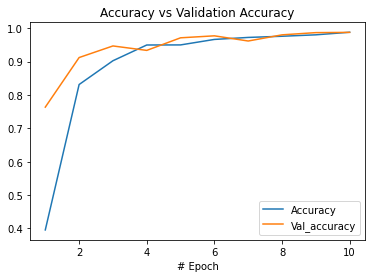

In [73]:
acc = []
val_acc = []
for i in range(len(hists)):
    acc += hists[i]["accuracy"]
    val_acc += hists[i]["val_accuracy"]
hist_df = pd.DataFrame({"# Epoch": [e for e in range(1,len(acc)+1)],"Accuracy": acc, "Val_accuracy": val_acc})
hist_df.plot(x = "# Epoch", y = ["Accuracy","Val_accuracy"])
plt.title("Accuracy vs Validation Accuracy")
plt.show()

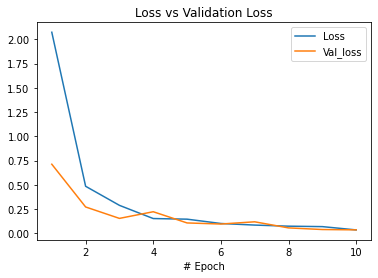

In [74]:
acc = []
val_acc = []
for i in range(len(hists)):
    acc += hists[i]["loss"]
    val_acc += hists[i]["val_loss"]
hist_df = pd.DataFrame({"# Epoch": [e for e in range(1,len(acc)+1)],"Loss": acc, "Val_loss": val_acc})
hist_df.plot(x = "# Epoch", y = ["Loss","Val_loss"])
plt.title("Loss vs Validation Loss")
plt.show()

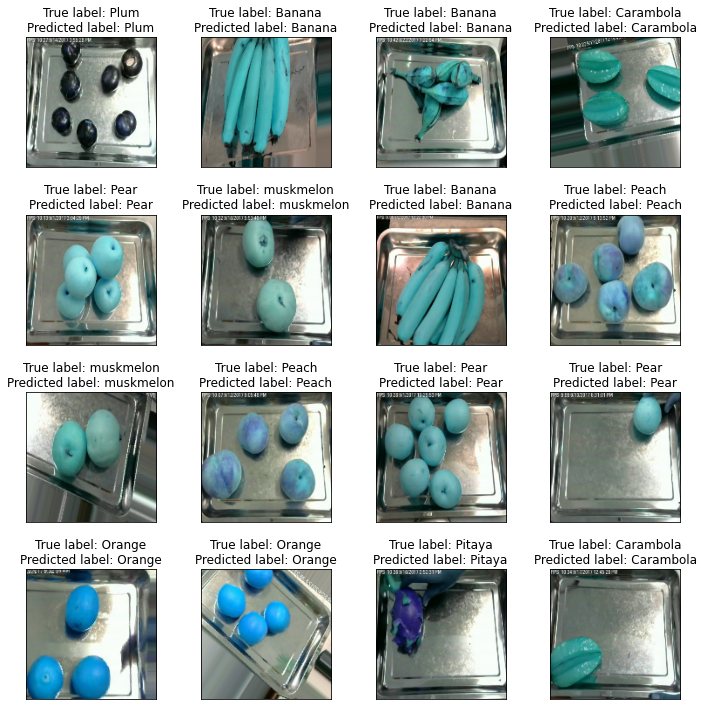

In [75]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(X[-i])
    ax.set_title(f"True label: {fruit_names[y[-i]]}\nPredicted label: {fruit_names[pred[-i]]}")

plt.tight_layout()
plt.show()

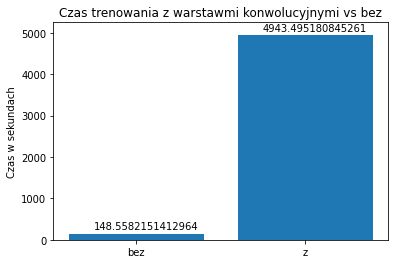

In [187]:
plt.bar(range(2),[end-start,convEnd-convStart])
plt.title("Czas trenowania z warstawmi konwolucyjnymi vs bez")
plt.xticks(range(2),["bez","z"])
plt.ylabel("Czas w sekundach")
plt.text(0-0.25,end-start+100,end-start)
plt.text(1-0.25,convEnd-convStart+100,convEnd-convStart)
plt.ylim(0,5250)
plt.show()